In [323]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport

%matplotlib inline

In [324]:
df = pd.read_csv("Transjakarta.csv")
df

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,106.83302,13,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,106.81435,38,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,106.93526,23,2023-04-03 05:44:51,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500.0
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,106.88900,5,2023-04-03 06:17:35,P00098,Kali Besar Barat,-6.135355,106.81143,15.0,2023-04-03 06:57:03,3500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37895,ZWEC949B8Q87QG,4685818286724028395,brizzi,Kamila Mahendra,F,2004,6B,Ragunan - MH Thamrin via Semanggi,1.0,P00261,...,106.82309,2,2023-04-21 18:18:37,P00228,SMK 57,-6.290967,106.82365,13.0,2023-04-21 19:55:49,3500.0
37896,YHHK837P6Y95GN,6502902290603767,dki,Titi Siregar,M,1974,9N,Pinang Ranti - Pramuka,1.0,P00064,...,106.88116,1,2023-04-18 21:52:31,P00179,Pinang Ranti,-6.291075,106.88634,2.0,2023-04-18 22:28:22,3500.0
37897,YXPP627N4G95HO,213159426675861,emoney,drg. Zahra Nashiruddin,F,1976,1T,Cibubur - Balai Kota,1.0,B02873P,...,106.81676,12,2023-04-04 10:29:47,B00226P,Buperta Cibubur,-6.370321,106.89628,14.0,2023-04-04 13:27:25,20000.0
37898,RGVK175U2U98UV,377840859133591,emoney,Ana Agustina,M,1976,JAK.13,Tanah Abang - Jembatan Lima,1.0,B02505P,...,106.80954,33,2023-04-15 19:59:26,B01787P,JPO Blok G,-6.188861,106.81135,34.0,2023-04-15 20:27:50,0.0


# Data Prep


In [325]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37900 entries, 0 to 37899
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   transID           37900 non-null  object 
 1   payCardID         37900 non-null  int64  
 2   payCardBank       37900 non-null  object 
 3   payCardName       37900 non-null  object 
 4   payCardSex        37900 non-null  object 
 5   payCardBirthDate  37900 non-null  int64  
 6   corridorID        36643 non-null  object 
 7   corridorName      35970 non-null  object 
 8   direction         37900 non-null  float64
 9   tapInStops        36687 non-null  object 
 10  tapInStopsName    37900 non-null  object 
 11  tapInStopsLat     37900 non-null  float64
 12  tapInStopsLon     37900 non-null  float64
 13  stopStartSeq      37900 non-null  int64  
 14  tapInTime         37900 non-null  object 
 15  tapOutStops       35611 non-null  object 
 16  tapOutStopsName   36556 non-null  object

## Data Formatting


In [326]:
df["tapInTime"] = pd.to_datetime(df["tapInTime"])
df["tapOutTime"] = pd.to_datetime(df["tapOutTime"])

In [327]:
# nambahin umur pengguna
df["age"] = 2024 - df["payCardBirthDate"]

In [328]:
df.shape

(37900, 23)

In [329]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37900 entries, 0 to 37899
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   transID           37900 non-null  object        
 1   payCardID         37900 non-null  int64         
 2   payCardBank       37900 non-null  object        
 3   payCardName       37900 non-null  object        
 4   payCardSex        37900 non-null  object        
 5   payCardBirthDate  37900 non-null  int64         
 6   corridorID        36643 non-null  object        
 7   corridorName      35970 non-null  object        
 8   direction         37900 non-null  float64       
 9   tapInStops        36687 non-null  object        
 10  tapInStopsName    37900 non-null  object        
 11  tapInStopsLat     37900 non-null  float64       
 12  tapInStopsLon     37900 non-null  float64       
 13  stopStartSeq      37900 non-null  int64         
 14  tapInTime         3790

## Missing Value


In [330]:
df.isna().sum()

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID          1257
corridorName        1930
direction              0
tapInStops          1213
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops         2289
tapOutStopsName     1344
tapOutStopsLat      1344
tapOutStopsLon      1344
stopEndSeq          1344
tapOutTime          1344
payAmount           1007
age                    0
dtype: int64

In [331]:
missing_percentage = df.isnull().mean() * 100

print("Persentase data yang kosong dalam setiap kolom:")
print(missing_percentage)

Persentase data yang kosong dalam setiap kolom:
transID             0.000000
payCardID           0.000000
payCardBank         0.000000
payCardName         0.000000
payCardSex          0.000000
payCardBirthDate    0.000000
corridorID          3.316623
corridorName        5.092348
direction           0.000000
tapInStops          3.200528
tapInStopsName      0.000000
tapInStopsLat       0.000000
tapInStopsLon       0.000000
stopStartSeq        0.000000
tapInTime           0.000000
tapOutStops         6.039578
tapOutStopsName     3.546174
tapOutStopsLat      3.546174
tapOutStopsLon      3.546174
stopEndSeq          3.546174
tapOutTime          3.546174
payAmount           2.656992
age                 0.000000
dtype: float64


Menghapus missing value, karena data yang kosong tersebut terhitung masih sedikit


In [332]:
df = df.dropna()

df.isna().sum()

transID             0
payCardID           0
payCardBank         0
payCardName         0
payCardSex          0
payCardBirthDate    0
corridorID          0
corridorName        0
direction           0
tapInStops          0
tapInStopsName      0
tapInStopsLat       0
tapInStopsLon       0
stopStartSeq        0
tapInTime           0
tapOutStops         0
tapOutStopsName     0
tapOutStopsLat      0
tapOutStopsLon      0
stopEndSeq          0
tapOutTime          0
payAmount           0
age                 0
dtype: int64

In [333]:
df.shape

(31730, 23)

In [334]:
df["travel_duration"] = (df["tapOutTime"] - df["tapInTime"]).dt.total_seconds() / 60

C:\Users\fiqri\AppData\Local\Temp\ipykernel_4104\1288225604.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["travel_duration"] = (df["tapOutTime"] - df["tapInTime"]).dt.total_seconds() / 60


## Check Outliers


Jumlah outliers pada kolom 'payAmount': 1533
Jumlah outliers pada kolom 'travel_duration': 34
Jumlah outliers pada kolom 'tapInStopsLat': 325
Jumlah outliers pada kolom 'tapInStopsLon': 485
Jumlah outliers pada kolom 'tapOutStopsLat': 302
Jumlah outliers pada kolom 'tapOutStopsLon': 392


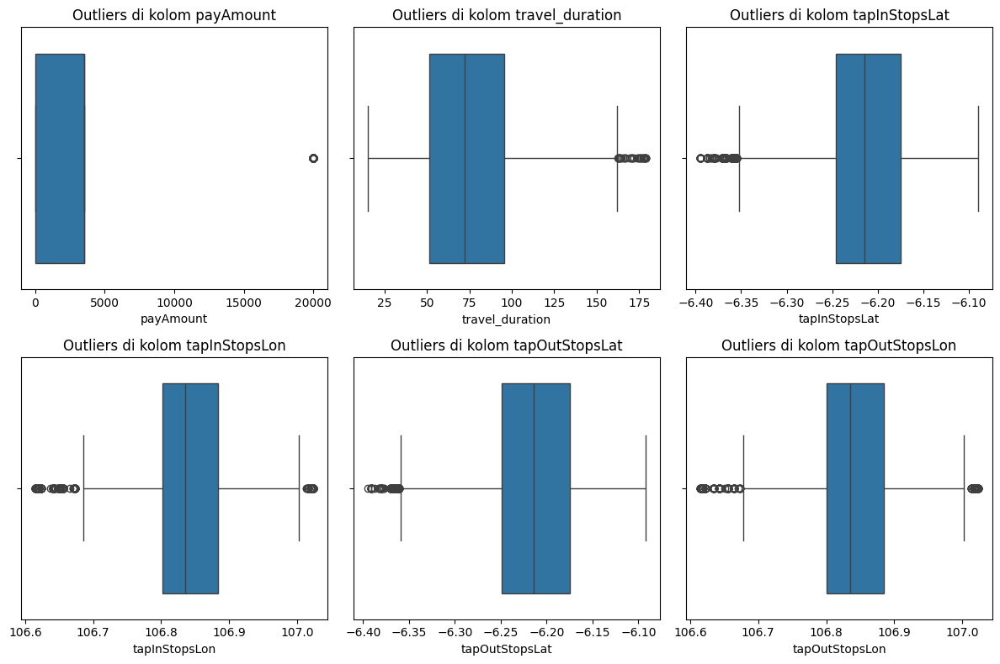

In [335]:
columns_to_analyze = [
    "payAmount",
    "travel_duration",
    "tapInStopsLat",
    "tapInStopsLon",
    "tapOutStopsLat",
    "tapOutStopsLon",
]


def detect_outliers_iqr(data, col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
    return outliers


outliers_dict = {}

for col in columns_to_analyze:
    outliers = detect_outliers_iqr(df, col)
    outliers_dict[col] = outliers
    print(f"Jumlah outliers pada kolom '{col}': {len(outliers)}")

plt.figure(figsize=(12, 8))
for i, col in enumerate(columns_to_analyze, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(data=df, x=col)
    plt.title(f"Outliers di kolom {col}")

plt.tight_layout()
plt.show()

Menghapus outliers pada kolom payAmount, karena tarif tarif 20rb adalah tarif Royaltrans, bukan Transjakarta

Outliers pada kolom travel_duration kemungkinan terjadi karena ada kejadian yang mengakibatkan kemacetan di jalur Transjakarta


In [336]:
Q1 = df["payAmount"].quantile(0.25)
Q3 = df["payAmount"].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
df = df[df["payAmount"] <= upper_bound]

In [337]:
df

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,age,travel_duration
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0,16,39.150000
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0,27,57.283333
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0,32,51.816667
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,2023-04-03 05:44:51,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500.0,46,43.416667
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,2023-04-03 06:17:35,P00098,Kali Besar Barat,-6.135355,106.81143,15.0,2023-04-03 06:57:03,3500.0,42,39.466667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37894,ZXVG342K6T27GU,4475487986105118550,brizzi,"Tgk. Dipa Purnawati, S.E.I",F,2012,JAK.39,Kalimalang - Duren Sawit,0.0,B04489P,...,2023-04-14 11:36:12,B01624P,Jln. Swakarsa III Pondok Kelapa,-6.244759,106.94249,35.0,2023-04-14 13:15:25,0.0,12,99.216667
37895,ZWEC949B8Q87QG,4685818286724028395,brizzi,Kamila Mahendra,F,2004,6B,Ragunan - MH Thamrin via Semanggi,1.0,P00261,...,2023-04-21 18:18:37,P00228,SMK 57,-6.290967,106.82365,13.0,2023-04-21 19:55:49,3500.0,20,97.200000
37896,YHHK837P6Y95GN,6502902290603767,dki,Titi Siregar,M,1974,9N,Pinang Ranti - Pramuka,1.0,P00064,...,2023-04-18 21:52:31,P00179,Pinang Ranti,-6.291075,106.88634,2.0,2023-04-18 22:28:22,3500.0,50,35.850000
37898,RGVK175U2U98UV,377840859133591,emoney,Ana Agustina,M,1976,JAK.13,Tanah Abang - Jembatan Lima,1.0,B02505P,...,2023-04-15 19:59:26,B01787P,JPO Blok G,-6.188861,106.81135,34.0,2023-04-15 20:27:50,0.0,48,28.400000


## Cek Duplikat


In [338]:
duplicates = df[df.duplicated()]

print("Jumlah data duplikat:", len(duplicates))

Jumlah data duplikat: 0


In [339]:
df.describe()

,payCardID,payCardBirthDate,direction,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,age,travel_duration
count,3.019700e+04,30197.000000,30197.000000,30197.000000,30197.000000,30197.000000,30197,30197.000000,30197.000000,30197.000000,30197,30197.000000,30197.000000,30197.000000
mean,4.019291e+17,1990.061496,0.500348,-6.213458,106.843149,14.025599,2023-04-16 07:58:29.796933632,-6.213031,106.842974,21.908964,2023-04-16 09:10:35.559823872,1844.520979,33.938504,72.096048
min,6.040368e+10,1946.000000,0.000000,-6.394973,106.614730,0.000000,2023-04-01 06:22:27,-6.394973,106.618070,1.000000,2023-04-01 07:27:31,0.000000,12.000000,15.000000
25%,1.800406e+14,1982.000000,0.000000,-6.245863,106.803470,4.000000,2023-04-10 09:17:22,-6.247225,106.801610,12.000000,2023-04-10 10:30:05,0.000000,23.000000,51.083333
50%,3.507108e+15,1991.000000,1.000000,-6.213410,106.839870,11.000000,2023-04-16 17:27:30,-6.213416,106.839060,19.000000,2023-04-16 18:49:45,3500.000000,33.000000,71.933333
75%,4.668070e+15,2001.000000,1.000000,-6.173827,106.885840,20.000000,2023-04-21 21:20:55,-6.172505,106.886130,30.000000,2023-04-21 22:46:18,3500.000000,42.000000,95.616667
max,4.997694e+18,2012.000000,1.000000,-6.089429,107.023950,68.000000,2023-04-30 21:51:08,-6.091746,107.023660,77.000000,2023-04-30 23:23:18,3500.000000,78.000000,179.050000
std,1.288353e+18,13.147709,0.500008,0.058719,0.060872,12.396173,NaN,0.059545,0.060881,13.933664,NaN,1747.474437,13.147709,28.069094


In [340]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Visualisasi


## Distribusi perjalanan umur dan kelamin


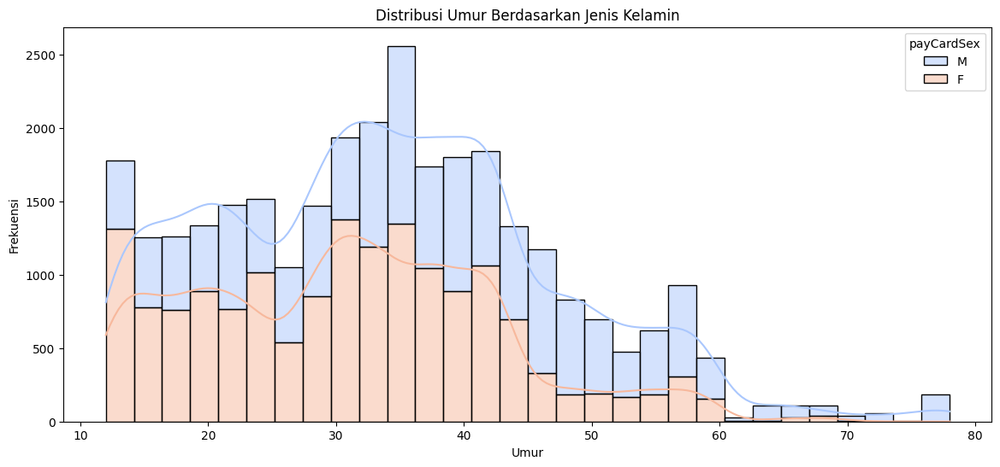

In [341]:
plt.figure(figsize=(14, 6))
sns.histplot(
    data=df,
    x="age",
    hue="payCardSex",
    multiple="stack",
    bins=30,
    palette="coolwarm",
    kde=True,
)
plt.title("Distribusi Umur Berdasarkan Jenis Kelamin")
plt.xlabel("Umur")
plt.ylabel("Frekuensi")
plt.show()

## Rata" durasi perjalanan umur dan kelamin


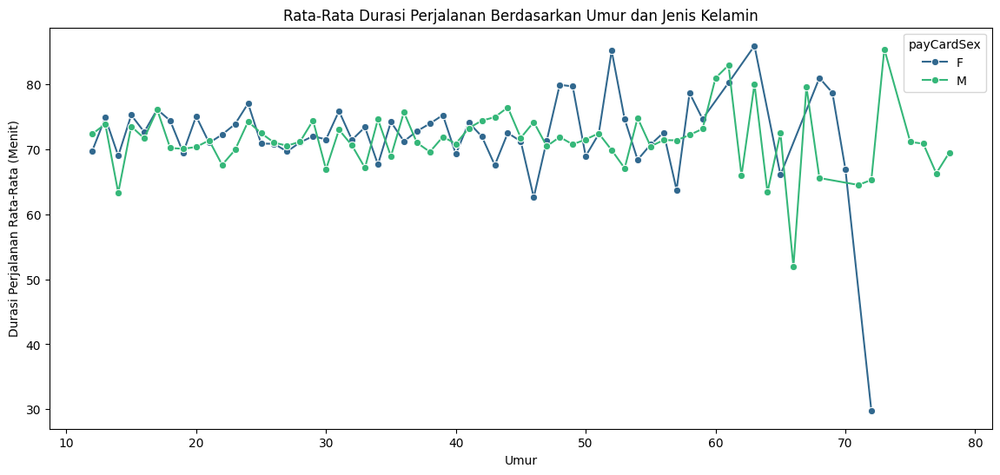

In [342]:
age_sex_duration = (
    df.groupby(["age", "payCardSex"])["travel_duration"].mean().reset_index()
)

plt.figure(figsize=(14, 6))
sns.lineplot(
    data=age_sex_duration,
    x="age",
    y="travel_duration",
    hue="payCardSex",
    marker="o",
    palette="viridis",
)
plt.title("Rata-Rata Durasi Perjalanan Berdasarkan Umur dan Jenis Kelamin")
plt.xlabel("Umur")
plt.ylabel("Durasi Perjalanan Rata-Rata (Menit)")
plt.show()

## Boxplot umur berdasarkan jenis kelamin


C:\Users\fiqri\AppData\Local\Temp\ipykernel_4104\2378488044.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="payCardSex", y="age", palette="pastel")


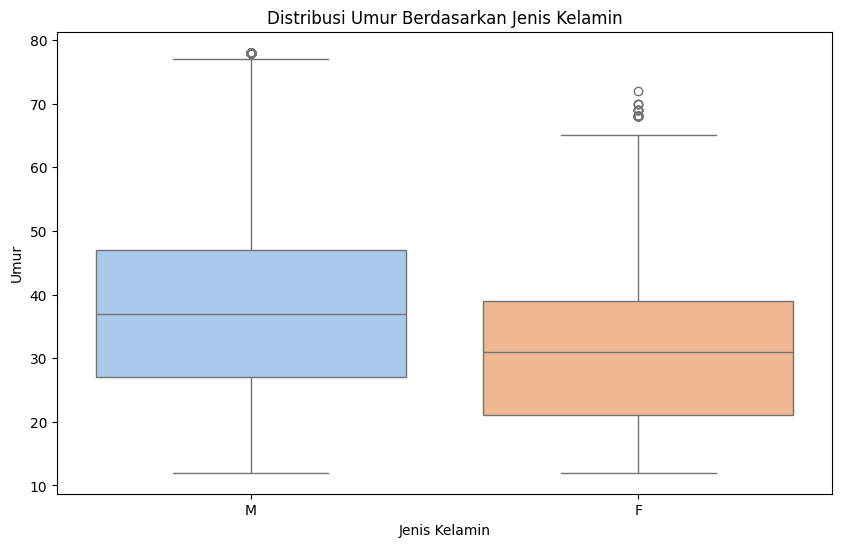

In [343]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="payCardSex", y="age", palette="pastel")
plt.title("Distribusi Umur Berdasarkan Jenis Kelamin")
plt.xlabel("Jenis Kelamin")
plt.ylabel("Umur")
plt.show()

In [344]:
df["tap_in_hour"] = df["tapInTime"].dt.hour
df["tap_in_day"] = df["tapInTime"].dt.day_name()

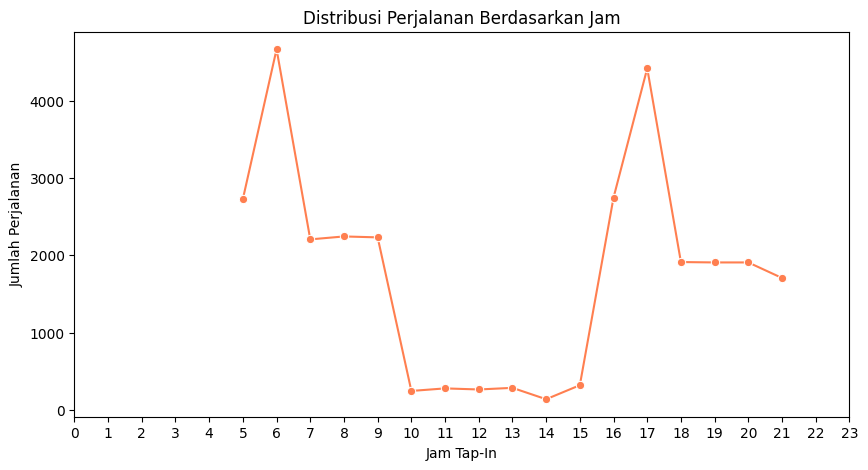

In [345]:
# Distribusi jam perjalanan
hourly_distribution = df.groupby("tap_in_hour").size().reset_index(name="total_trips")

plt.figure(figsize=(10, 5))
sns.lineplot(
    data=hourly_distribution,
    x="tap_in_hour",
    y="total_trips",
    marker="o",
    color="coral",
)
plt.title("Distribusi Perjalanan Berdasarkan Jam")
plt.xlabel("Jam Tap-In")
plt.ylabel("Jumlah Perjalanan")
plt.xticks(range(0, 24))
plt.show()

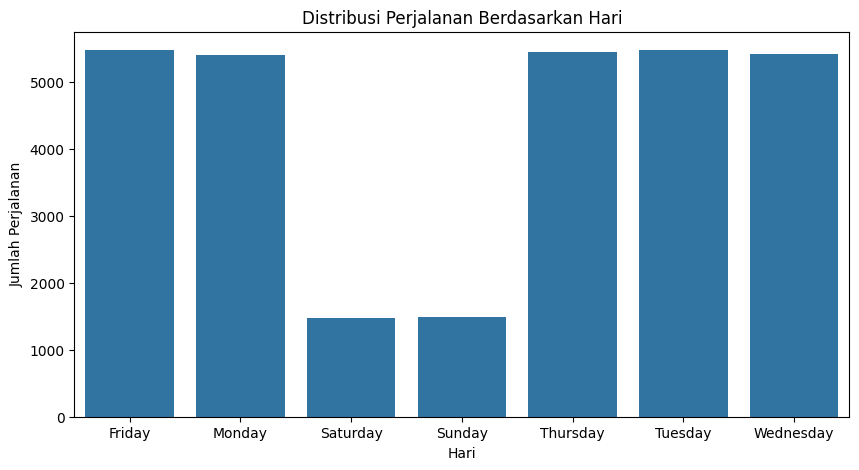

In [346]:
# Distribusi hari perjalanan
daily_distribution = df.groupby("tap_in_day").size().reset_index(name="total_trips")
daily_distribution = daily_distribution.sort_values(by="tap_in_day")

plt.figure(figsize=(10, 5))
sns.barplot(data=daily_distribution, x="tap_in_day", y="total_trips")
plt.title("Distribusi Perjalanan Berdasarkan Hari")
plt.xlabel("Hari")
plt.ylabel("Jumlah Perjalanan")
plt.show()

## Top rute


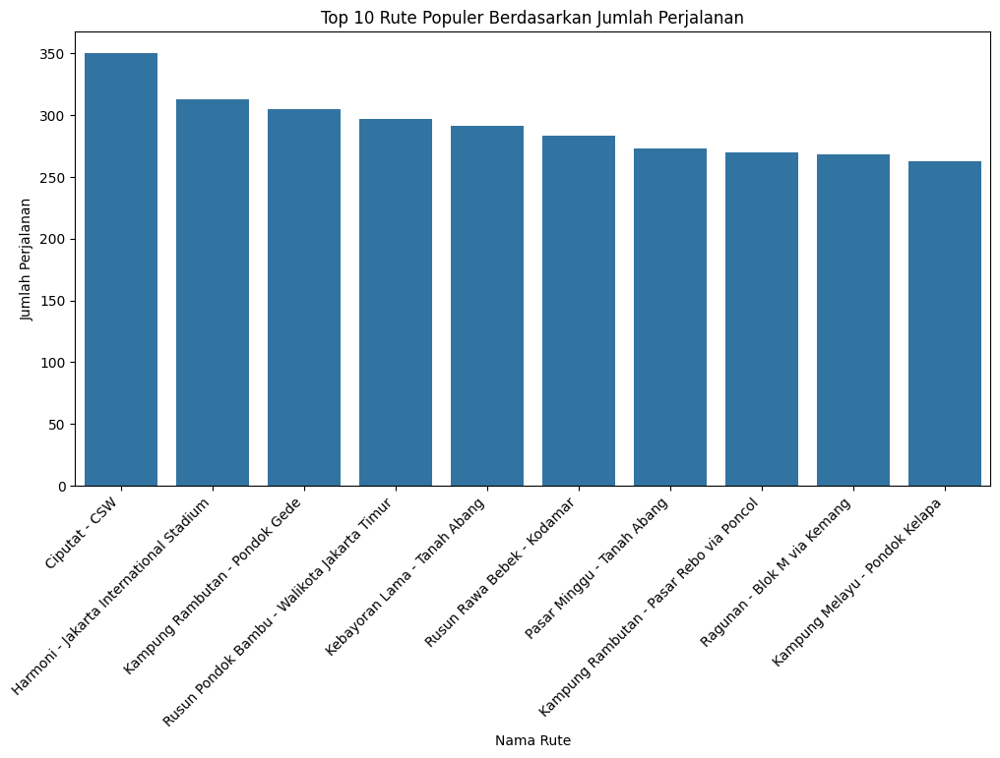

In [347]:
route_popularity = (
    df.groupby(["corridorID", "corridorName"]).size().reset_index(name="total_trips")
)
route_popularity = route_popularity.sort_values(by="total_trips", ascending=False).head(
    10
)


plt.figure(figsize=(12, 6))
sns.barplot(data=route_popularity, x="corridorName", y="total_trips")
plt.xticks(rotation=45, ha="right")
plt.title("Top 10 Rute Populer Berdasarkan Jumlah Perjalanan")
plt.xlabel("Nama Rute")
plt.ylabel("Jumlah Perjalanan")
plt.show()

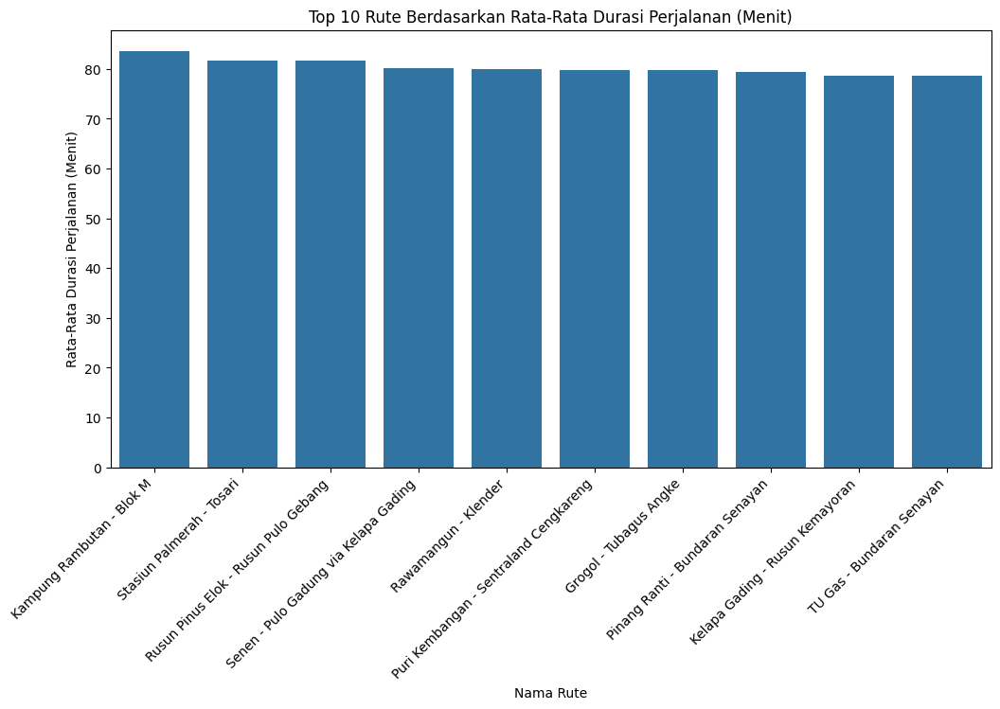

In [348]:
route_duration_stats = (
    df.groupby("corridorName")["travel_duration"].mean().reset_index()
)
route_duration_stats = route_duration_stats.sort_values(
    by="travel_duration", ascending=False
).head(10)


plt.figure(figsize=(12, 6))
sns.barplot(data=route_duration_stats, x="corridorName", y="travel_duration")
plt.xticks(rotation=45, ha="right")
plt.title("Top 10 Rute Berdasarkan Rata-Rata Durasi Perjalanan (Menit)")
plt.xlabel("Nama Rute")
plt.ylabel("Rata-Rata Durasi Perjalanan (Menit)")
plt.show()

## Distribusi pengguna berdasarkan koridor masuk


In [349]:
top_corridors = df["tapInStopsName"].value_counts().head(10).index
data_top_corridors = df[df["tapInStopsName"].isin(top_corridors)]

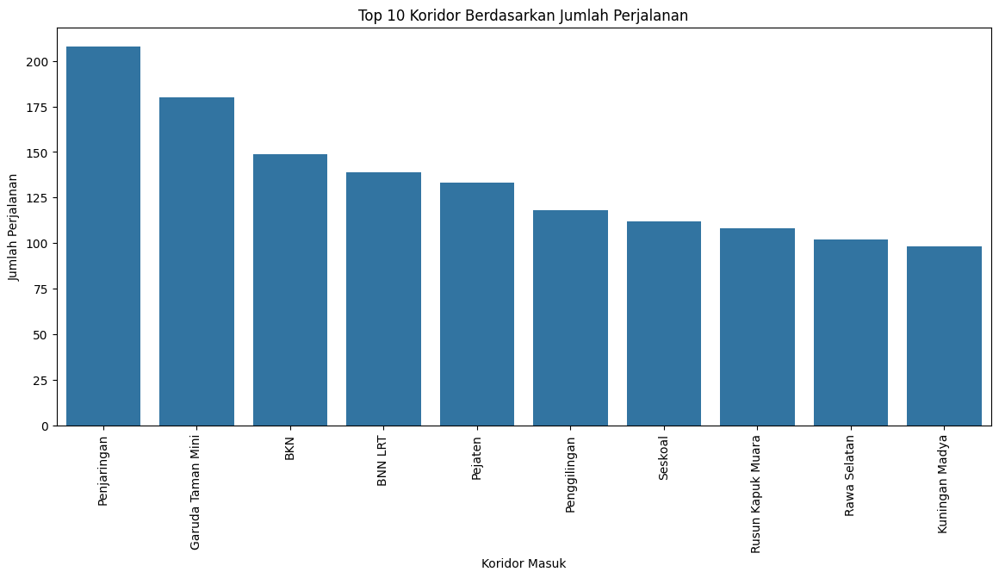

In [350]:
corridor_counts = data_top_corridors["tapInStopsName"].value_counts().reset_index()
corridor_counts.columns = ["tapInStopsName", "total_trips"]

plt.figure(figsize=(14, 6))
sns.barplot(data=corridor_counts, x="tapInStopsName", y="total_trips")
plt.xticks(rotation=90)
plt.title("Top 10 Koridor Berdasarkan Jumlah Perjalanan")
plt.xlabel("Koridor Masuk")
plt.ylabel("Jumlah Perjalanan")
plt.show()

## Durasi Perjalanan Dari top 10 Koridor


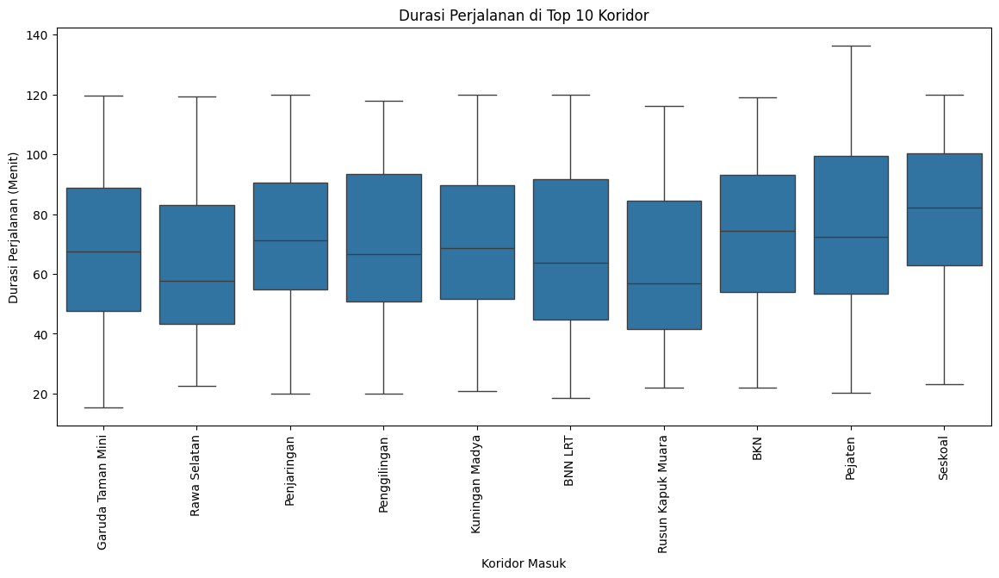

In [351]:
plt.figure(figsize=(14, 6))
sns.boxplot(data=data_top_corridors, x="tapInStopsName", y="travel_duration")
plt.xticks(rotation=90)
plt.title("Durasi Perjalanan di Top 10 Koridor")
plt.xlabel("Koridor Masuk")
plt.ylabel("Durasi Perjalanan (Menit)")
plt.show()

## Volume perjalanan harian di top 10 koridor


C:\Users\fiqri\AppData\Local\Temp\ipykernel_4104\403105854.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_top_corridors["tap_in_day"] = data_top_corridors["tapInTime"].dt.day_name()


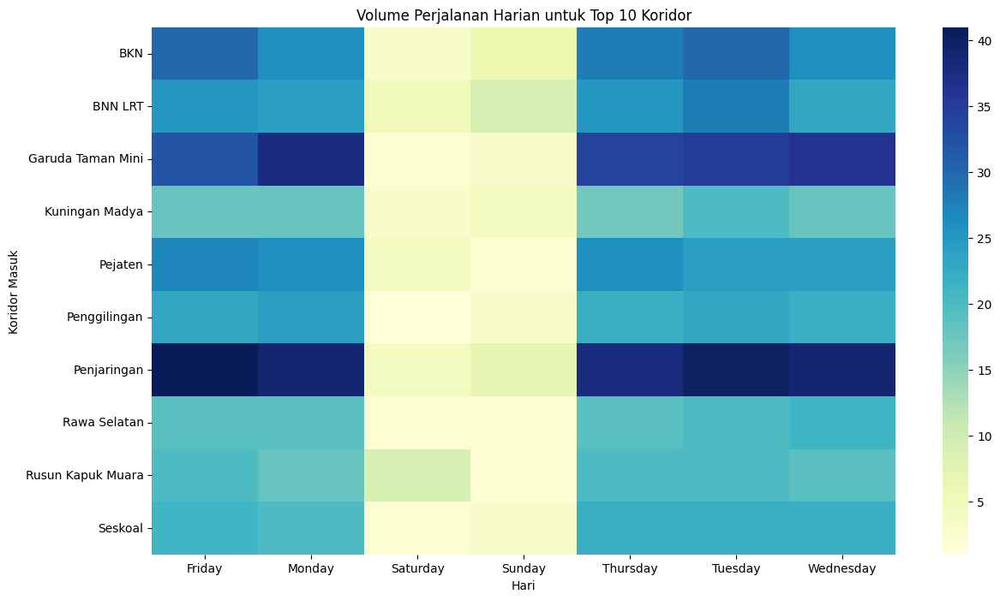

In [352]:
data_top_corridors["tap_in_day"] = data_top_corridors["tapInTime"].dt.day_name()
corridor_day_volume_top = (
    data_top_corridors.groupby(["tapInStopsName", "tap_in_day"])
    .size()
    .unstack(fill_value=0)
)

plt.figure(figsize=(14, 8))
sns.heatmap(corridor_day_volume_top, cmap="YlGnBu", annot=False, cbar=True)
plt.title("Volume Perjalanan Harian untuk Top 10 Koridor")
plt.xlabel("Hari")
plt.ylabel("Koridor Masuk")
plt.show()

## Distribusi Waktu Perjalanan


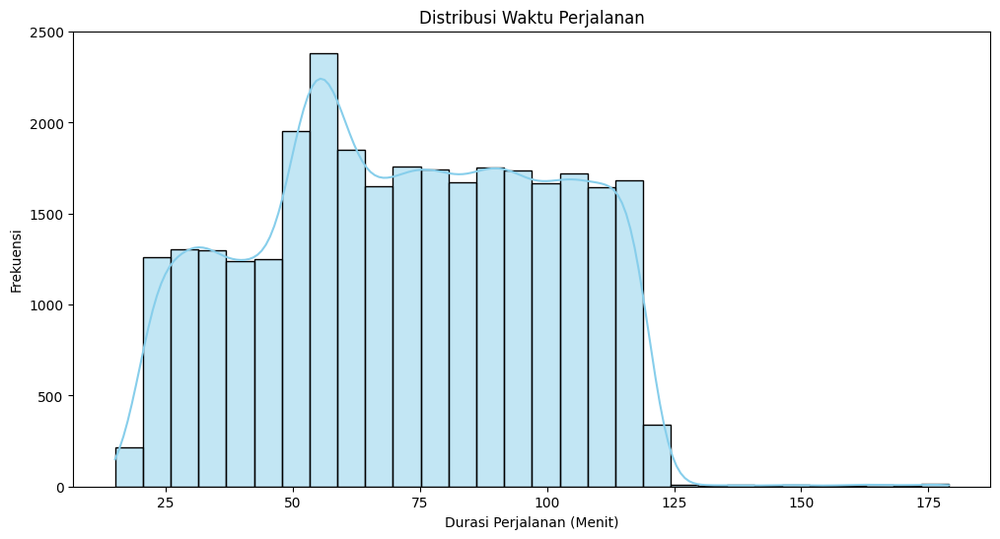

In [353]:
# Plot distribusi waktu perjalanan
plt.figure(figsize=(12, 6))
sns.histplot(df["travel_duration"], bins=30, kde=True, color="skyblue")
plt.title("Distribusi Waktu Perjalanan")
plt.xlabel("Durasi Perjalanan (Menit)")
plt.ylabel("Frekuensi")
plt.show()

## Pendapatan per Rute


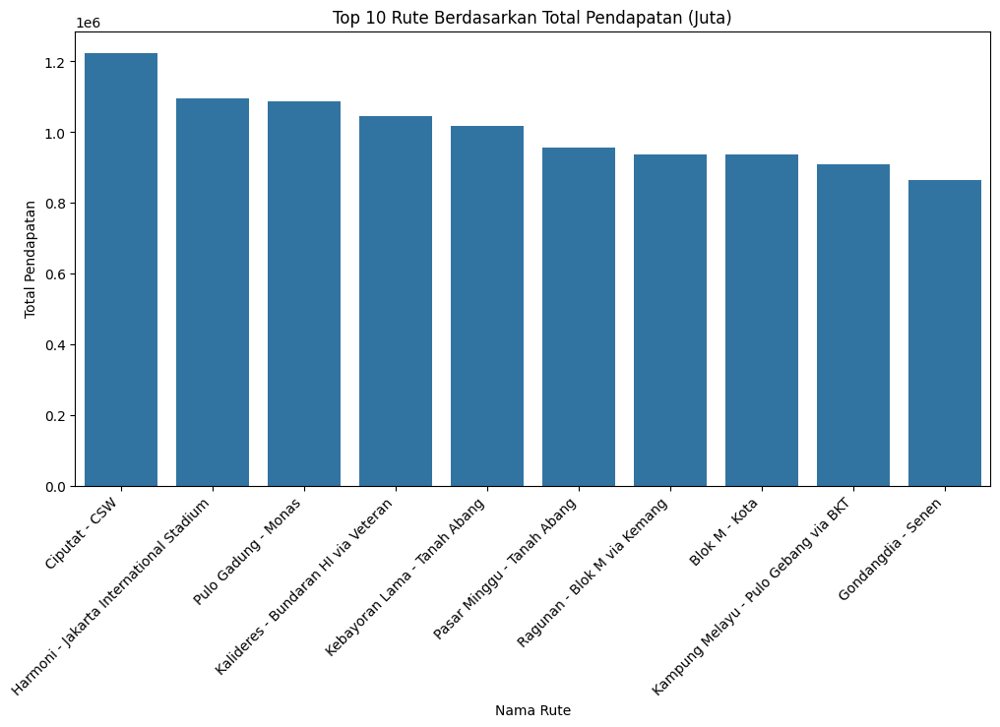

In [354]:
route_revenue = (
    df.groupby("corridorName")["payAmount"].sum().reset_index(name="total_revenue")
)
route_revenue = route_revenue.sort_values(by="total_revenue", ascending=False).head(10)


plt.figure(figsize=(12, 6))
sns.barplot(data=route_revenue, x="corridorName", y="total_revenue")
plt.xticks(rotation=45, ha="right")
plt.title("Top 10 Rute Berdasarkan Total Pendapatan (Juta)")
plt.xlabel("Nama Rute")
plt.ylabel("Total Pendapatan")
plt.show()

## Pola perjalanan di jam sibuk dan non-sibuk


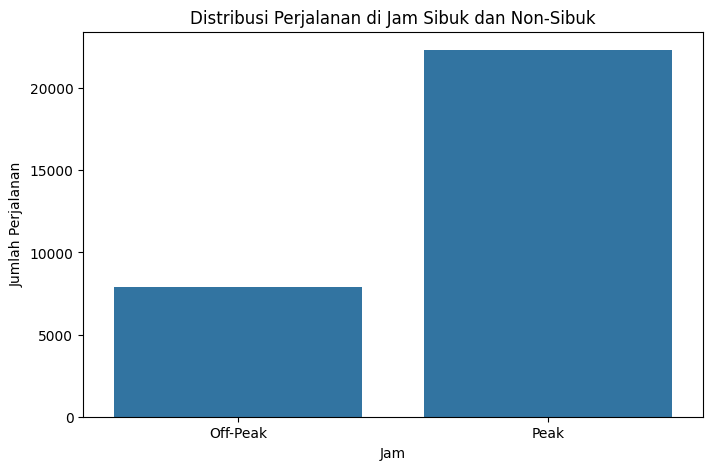

In [355]:
df["peak_hours"] = df["tap_in_hour"].apply(
    lambda x: "Peak" if (6 <= x <= 9 or 16 <= x <= 19) else "Off-Peak"
)
peak_distribution = df.groupby("peak_hours").size().reset_index(name="total_trips")


plt.figure(figsize=(8, 5))
sns.barplot(data=peak_distribution, x="peak_hours", y="total_trips")
plt.title("Distribusi Perjalanan di Jam Sibuk dan Non-Sibuk")
plt.xlabel("Jam")
plt.ylabel("Jumlah Perjalanan")
plt.show()

In [356]:
# df.to_csv('tj.csv', index=False)